# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:11<00:00, 5.33KFile/s]


Extracting celeba...


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

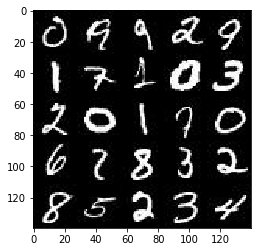

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

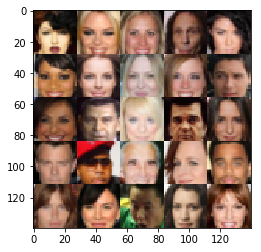

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='z_dim')
    learning_rate = tf.placeholder(tf.float32, name = 'learning_rate')

    return (input_real, input_z, learning_rate)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))#4*4*256是这一层中的单元数量，flat 是扁平化后的层中的单元数量
        logits = tf.layers.dense(flat, 1)#让flat通过只有一个单元的全连接层，而这个单元是我们要发送给sigmoid函数的输出
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    
    reuse = not is_train
    
#     if is_train==True:
#         reuse = False
#     else:
#         reuse = True
        
    with tf.variable_scope('generator',reuse = reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1,training = is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training = is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x256 now
        
#         x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
#         x3 = tf.layers.batch_normalization(x3, training=training)
#         x3 = tf.maximum(alpha * x3, x3)
#         # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x3 now
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    alpha = 0.2
    g_model = generator(input_z, out_channel_dim, is_train = True)
    d_model_real, d_logits_real = discriminator(input_real, reuse = False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [36]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    steps = 0
    _, image_width, image_height, image_channels = data_shape
    input_real, input_z, lr = model_inputs(image_width, image_height,image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z,image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    is_train = tf.placeholder(tf.bool)
        
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images = batch_images * 2
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                 # Run optimizers
                _ = sess.run(d_opt,
                             feed_dict={input_z: batch_z,
                                        input_real: batch_images,
                                        lr: learning_rate})
                _ = sess.run(g_opt, 
                             feed_dict={input_z: batch_z, 
                                        input_real: batch_images,
                                        lr: learning_rate})
                                
                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % 100 == 0:
                    #Print the current image
                    show_generator_output(sess, 50, input_z, image_channels, data_image_mode)

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

Epoch 1/2... Discriminator Loss: 0.6480... Generator Loss: 1.1087
Epoch 1/2... Discriminator Loss: 1.1568... Generator Loss: 0.7021
Epoch 1/2... Discriminator Loss: 1.1225... Generator Loss: 0.6731
Epoch 1/2... Discriminator Loss: 0.8862... Generator Loss: 0.7495
Epoch 1/2... Discriminator Loss: 1.2384... Generator Loss: 3.1072
Epoch 1/2... Discriminator Loss: 1.2099... Generator Loss: 0.4740
Epoch 1/2... Discriminator Loss: 0.9661... Generator Loss: 1.7660
Epoch 1/2... Discriminator Loss: 1.2194... Generator Loss: 1.9947
Epoch 1/2... Discriminator Loss: 1.0472... Generator Loss: 1.7189
Epoch 1/2... Discriminator Loss: 0.9856... Generator Loss: 1.3173


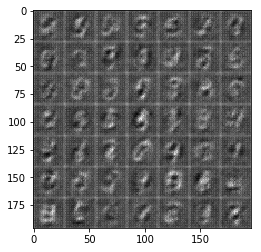

Epoch 1/2... Discriminator Loss: 1.2004... Generator Loss: 1.8754
Epoch 1/2... Discriminator Loss: 1.2219... Generator Loss: 0.4643
Epoch 1/2... Discriminator Loss: 0.9239... Generator Loss: 1.0969
Epoch 1/2... Discriminator Loss: 0.9440... Generator Loss: 0.7184
Epoch 1/2... Discriminator Loss: 1.0995... Generator Loss: 0.5815
Epoch 1/2... Discriminator Loss: 0.9297... Generator Loss: 0.8205
Epoch 1/2... Discriminator Loss: 0.9812... Generator Loss: 0.6765
Epoch 1/2... Discriminator Loss: 0.8967... Generator Loss: 1.7650
Epoch 1/2... Discriminator Loss: 0.8810... Generator Loss: 1.8962
Epoch 1/2... Discriminator Loss: 0.7903... Generator Loss: 0.8697


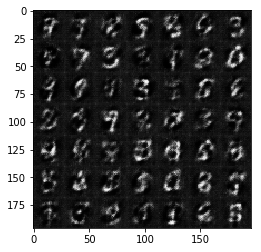

Epoch 1/2... Discriminator Loss: 1.1015... Generator Loss: 2.3836
Epoch 1/2... Discriminator Loss: 0.7265... Generator Loss: 1.1819
Epoch 1/2... Discriminator Loss: 1.0629... Generator Loss: 0.5921
Epoch 1/2... Discriminator Loss: 0.7861... Generator Loss: 1.3861
Epoch 1/2... Discriminator Loss: 0.6914... Generator Loss: 1.4246
Epoch 1/2... Discriminator Loss: 0.7852... Generator Loss: 1.3828
Epoch 1/2... Discriminator Loss: 0.8095... Generator Loss: 2.2353
Epoch 1/2... Discriminator Loss: 0.6868... Generator Loss: 1.2178
Epoch 1/2... Discriminator Loss: 0.6606... Generator Loss: 1.6240
Epoch 1/2... Discriminator Loss: 0.7980... Generator Loss: 0.8497


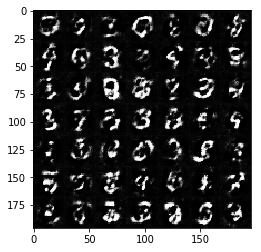

Epoch 1/2... Discriminator Loss: 0.8090... Generator Loss: 2.1667
Epoch 1/2... Discriminator Loss: 0.5480... Generator Loss: 1.3525
Epoch 1/2... Discriminator Loss: 0.5786... Generator Loss: 1.5455
Epoch 1/2... Discriminator Loss: 0.7034... Generator Loss: 0.9235
Epoch 1/2... Discriminator Loss: 0.4715... Generator Loss: 1.5074
Epoch 1/2... Discriminator Loss: 0.6380... Generator Loss: 1.1909
Epoch 1/2... Discriminator Loss: 0.6510... Generator Loss: 1.6683
Epoch 1/2... Discriminator Loss: 0.6101... Generator Loss: 2.1081
Epoch 1/2... Discriminator Loss: 0.5898... Generator Loss: 2.0619
Epoch 1/2... Discriminator Loss: 0.6367... Generator Loss: 1.2329


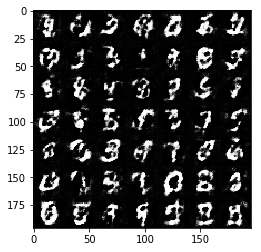

Epoch 1/2... Discriminator Loss: 0.5705... Generator Loss: 1.2108
Epoch 1/2... Discriminator Loss: 0.4670... Generator Loss: 1.8937
Epoch 1/2... Discriminator Loss: 0.6297... Generator Loss: 1.0041
Epoch 1/2... Discriminator Loss: 0.8452... Generator Loss: 0.7142
Epoch 1/2... Discriminator Loss: 0.7868... Generator Loss: 0.8156
Epoch 1/2... Discriminator Loss: 0.5754... Generator Loss: 2.0866
Epoch 1/2... Discriminator Loss: 0.5280... Generator Loss: 1.5745
Epoch 1/2... Discriminator Loss: 1.3664... Generator Loss: 0.4125
Epoch 1/2... Discriminator Loss: 0.7010... Generator Loss: 0.9345
Epoch 1/2... Discriminator Loss: 0.9576... Generator Loss: 0.6290


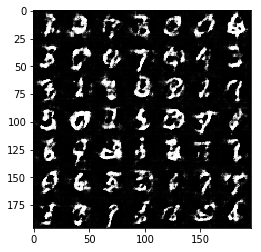

Epoch 1/2... Discriminator Loss: 0.4871... Generator Loss: 1.5186
Epoch 1/2... Discriminator Loss: 0.5015... Generator Loss: 1.9158
Epoch 1/2... Discriminator Loss: 0.6297... Generator Loss: 1.2367
Epoch 1/2... Discriminator Loss: 0.5205... Generator Loss: 1.8412
Epoch 1/2... Discriminator Loss: 0.9092... Generator Loss: 2.7375
Epoch 1/2... Discriminator Loss: 0.5975... Generator Loss: 1.3522
Epoch 1/2... Discriminator Loss: 0.8587... Generator Loss: 0.7728
Epoch 1/2... Discriminator Loss: 0.6984... Generator Loss: 1.0503
Epoch 1/2... Discriminator Loss: 0.8057... Generator Loss: 0.8118
Epoch 1/2... Discriminator Loss: 0.9753... Generator Loss: 2.3986


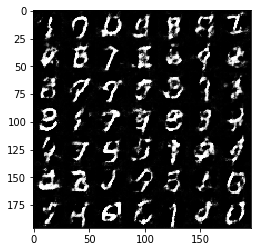

Epoch 1/2... Discriminator Loss: 0.7006... Generator Loss: 1.0803
Epoch 1/2... Discriminator Loss: 0.6154... Generator Loss: 1.1497
Epoch 1/2... Discriminator Loss: 0.6974... Generator Loss: 2.2291
Epoch 1/2... Discriminator Loss: 0.6773... Generator Loss: 1.1998
Epoch 1/2... Discriminator Loss: 0.6917... Generator Loss: 1.8751
Epoch 1/2... Discriminator Loss: 1.0761... Generator Loss: 2.9627
Epoch 1/2... Discriminator Loss: 0.6984... Generator Loss: 1.1345
Epoch 1/2... Discriminator Loss: 1.1109... Generator Loss: 0.5287
Epoch 1/2... Discriminator Loss: 0.8611... Generator Loss: 0.7016
Epoch 1/2... Discriminator Loss: 0.5992... Generator Loss: 1.5361


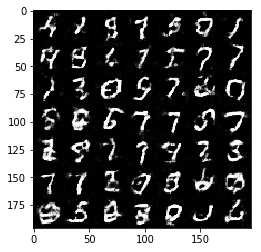

Epoch 1/2... Discriminator Loss: 0.6122... Generator Loss: 1.4247
Epoch 1/2... Discriminator Loss: 0.7479... Generator Loss: 1.1532
Epoch 1/2... Discriminator Loss: 0.7120... Generator Loss: 1.3008
Epoch 1/2... Discriminator Loss: 0.7077... Generator Loss: 1.6141
Epoch 1/2... Discriminator Loss: 0.7403... Generator Loss: 0.8810
Epoch 1/2... Discriminator Loss: 0.9298... Generator Loss: 0.7492
Epoch 1/2... Discriminator Loss: 0.6746... Generator Loss: 1.0675
Epoch 1/2... Discriminator Loss: 0.8218... Generator Loss: 0.8678
Epoch 1/2... Discriminator Loss: 0.7339... Generator Loss: 2.1089
Epoch 1/2... Discriminator Loss: 0.8501... Generator Loss: 0.8431


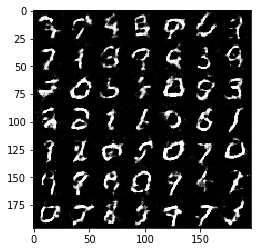

Epoch 1/2... Discriminator Loss: 0.5775... Generator Loss: 1.8277
Epoch 1/2... Discriminator Loss: 0.6529... Generator Loss: 1.7530
Epoch 1/2... Discriminator Loss: 0.8670... Generator Loss: 2.5022
Epoch 1/2... Discriminator Loss: 0.8762... Generator Loss: 0.8702
Epoch 1/2... Discriminator Loss: 0.7338... Generator Loss: 1.0344
Epoch 1/2... Discriminator Loss: 0.7593... Generator Loss: 0.8706
Epoch 1/2... Discriminator Loss: 0.8533... Generator Loss: 0.7697
Epoch 1/2... Discriminator Loss: 0.7015... Generator Loss: 1.7914
Epoch 1/2... Discriminator Loss: 0.9624... Generator Loss: 1.9965
Epoch 1/2... Discriminator Loss: 1.1071... Generator Loss: 0.5403


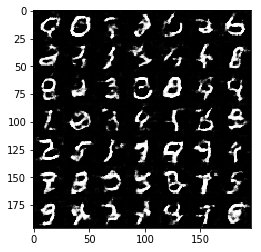

Epoch 1/2... Discriminator Loss: 0.7663... Generator Loss: 1.1277
Epoch 1/2... Discriminator Loss: 0.6821... Generator Loss: 1.7058
Epoch 1/2... Discriminator Loss: 0.9054... Generator Loss: 2.2942
Epoch 2/2... Discriminator Loss: 0.5924... Generator Loss: 1.4060
Epoch 2/2... Discriminator Loss: 0.7962... Generator Loss: 1.1250
Epoch 2/2... Discriminator Loss: 0.6590... Generator Loss: 1.8065
Epoch 2/2... Discriminator Loss: 0.7992... Generator Loss: 0.8432
Epoch 2/2... Discriminator Loss: 0.6486... Generator Loss: 1.3511
Epoch 2/2... Discriminator Loss: 0.6390... Generator Loss: 1.3241
Epoch 2/2... Discriminator Loss: 0.8251... Generator Loss: 0.9175


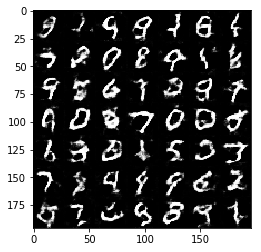

Epoch 2/2... Discriminator Loss: 0.5476... Generator Loss: 1.3018
Epoch 2/2... Discriminator Loss: 0.6642... Generator Loss: 1.3416
Epoch 2/2... Discriminator Loss: 0.8329... Generator Loss: 1.9520
Epoch 2/2... Discriminator Loss: 0.7194... Generator Loss: 2.0566
Epoch 2/2... Discriminator Loss: 1.0085... Generator Loss: 0.6351
Epoch 2/2... Discriminator Loss: 0.8453... Generator Loss: 1.9716
Epoch 2/2... Discriminator Loss: 0.8435... Generator Loss: 0.7595
Epoch 2/2... Discriminator Loss: 0.6727... Generator Loss: 1.4817
Epoch 2/2... Discriminator Loss: 0.5880... Generator Loss: 1.6952
Epoch 2/2... Discriminator Loss: 0.7295... Generator Loss: 1.0693


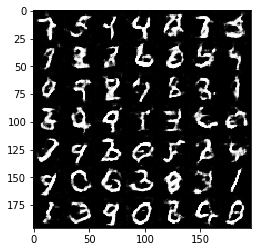

Epoch 2/2... Discriminator Loss: 0.6024... Generator Loss: 1.2925
Epoch 2/2... Discriminator Loss: 0.7490... Generator Loss: 1.1536
Epoch 2/2... Discriminator Loss: 0.6344... Generator Loss: 1.6203
Epoch 2/2... Discriminator Loss: 1.1276... Generator Loss: 0.5060
Epoch 2/2... Discriminator Loss: 0.5714... Generator Loss: 1.5020
Epoch 2/2... Discriminator Loss: 0.9004... Generator Loss: 0.7075
Epoch 2/2... Discriminator Loss: 1.1177... Generator Loss: 2.6541
Epoch 2/2... Discriminator Loss: 0.7300... Generator Loss: 1.1046
Epoch 2/2... Discriminator Loss: 0.8246... Generator Loss: 0.7398
Epoch 2/2... Discriminator Loss: 0.6497... Generator Loss: 1.1964


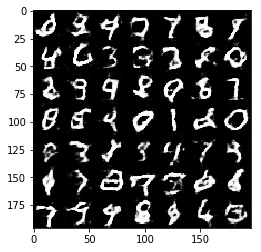

Epoch 2/2... Discriminator Loss: 0.6169... Generator Loss: 1.5145
Epoch 2/2... Discriminator Loss: 0.7651... Generator Loss: 0.8390
Epoch 2/2... Discriminator Loss: 0.9670... Generator Loss: 0.6321
Epoch 2/2... Discriminator Loss: 0.6319... Generator Loss: 1.3530
Epoch 2/2... Discriminator Loss: 0.6439... Generator Loss: 1.0666
Epoch 2/2... Discriminator Loss: 0.6468... Generator Loss: 1.6495
Epoch 2/2... Discriminator Loss: 0.5758... Generator Loss: 1.2919
Epoch 2/2... Discriminator Loss: 0.6220... Generator Loss: 1.1944
Epoch 2/2... Discriminator Loss: 0.6065... Generator Loss: 1.1128
Epoch 2/2... Discriminator Loss: 0.6463... Generator Loss: 1.6512


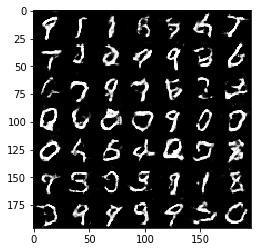

Epoch 2/2... Discriminator Loss: 0.5668... Generator Loss: 1.2637
Epoch 2/2... Discriminator Loss: 1.2021... Generator Loss: 0.4727
Epoch 2/2... Discriminator Loss: 0.6727... Generator Loss: 1.9213
Epoch 2/2... Discriminator Loss: 0.8223... Generator Loss: 0.7295
Epoch 2/2... Discriminator Loss: 0.5977... Generator Loss: 2.1330
Epoch 2/2... Discriminator Loss: 0.6440... Generator Loss: 2.0598
Epoch 2/2... Discriminator Loss: 0.5802... Generator Loss: 1.6568
Epoch 2/2... Discriminator Loss: 0.7590... Generator Loss: 0.8359
Epoch 2/2... Discriminator Loss: 0.8649... Generator Loss: 0.7284
Epoch 2/2... Discriminator Loss: 0.6847... Generator Loss: 2.1839


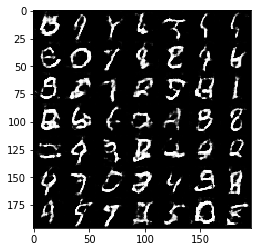

Epoch 2/2... Discriminator Loss: 0.6594... Generator Loss: 1.0104
Epoch 2/2... Discriminator Loss: 0.6382... Generator Loss: 1.3168
Epoch 2/2... Discriminator Loss: 0.5993... Generator Loss: 1.2371
Epoch 2/2... Discriminator Loss: 0.5804... Generator Loss: 1.2131
Epoch 2/2... Discriminator Loss: 0.6650... Generator Loss: 1.1300
Epoch 2/2... Discriminator Loss: 0.5125... Generator Loss: 1.3445
Epoch 2/2... Discriminator Loss: 0.5560... Generator Loss: 1.3430
Epoch 2/2... Discriminator Loss: 0.5155... Generator Loss: 1.8418
Epoch 2/2... Discriminator Loss: 0.4685... Generator Loss: 1.6058
Epoch 2/2... Discriminator Loss: 0.5679... Generator Loss: 1.1408


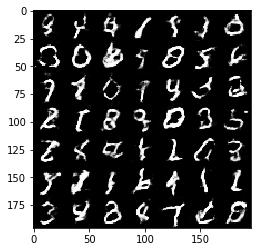

Epoch 2/2... Discriminator Loss: 0.9948... Generator Loss: 0.7438
Epoch 2/2... Discriminator Loss: 0.5985... Generator Loss: 1.4606
Epoch 2/2... Discriminator Loss: 0.7175... Generator Loss: 0.9540
Epoch 2/2... Discriminator Loss: 0.5180... Generator Loss: 2.2117
Epoch 2/2... Discriminator Loss: 0.5776... Generator Loss: 1.2248
Epoch 2/2... Discriminator Loss: 0.6425... Generator Loss: 1.1289
Epoch 2/2... Discriminator Loss: 0.5811... Generator Loss: 1.8620
Epoch 2/2... Discriminator Loss: 0.5577... Generator Loss: 1.7937
Epoch 2/2... Discriminator Loss: 0.9801... Generator Loss: 3.2353
Epoch 2/2... Discriminator Loss: 0.6070... Generator Loss: 1.2298


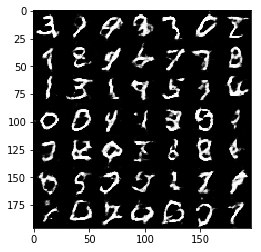

Epoch 2/2... Discriminator Loss: 0.4980... Generator Loss: 1.3532
Epoch 2/2... Discriminator Loss: 0.4769... Generator Loss: 1.3255
Epoch 2/2... Discriminator Loss: 0.4394... Generator Loss: 1.9159
Epoch 2/2... Discriminator Loss: 0.5101... Generator Loss: 1.2133
Epoch 2/2... Discriminator Loss: 0.5164... Generator Loss: 1.2931
Epoch 2/2... Discriminator Loss: 0.4734... Generator Loss: 1.7870
Epoch 2/2... Discriminator Loss: 0.4203... Generator Loss: 1.4805
Epoch 2/2... Discriminator Loss: 0.4536... Generator Loss: 1.3614
Epoch 2/2... Discriminator Loss: 0.6368... Generator Loss: 1.0465
Epoch 2/2... Discriminator Loss: 0.5571... Generator Loss: 1.2848


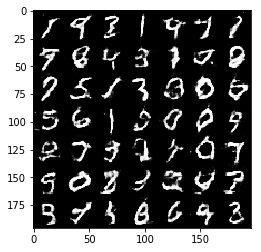

Epoch 2/2... Discriminator Loss: 0.5034... Generator Loss: 2.0735
Epoch 2/2... Discriminator Loss: 0.5943... Generator Loss: 1.2442
Epoch 2/2... Discriminator Loss: 0.5736... Generator Loss: 1.1244
Epoch 2/2... Discriminator Loss: 0.6779... Generator Loss: 1.7290
Epoch 2/2... Discriminator Loss: 0.4495... Generator Loss: 1.5177
Epoch 2/2... Discriminator Loss: 0.5074... Generator Loss: 1.6409
Epoch 2/2... Discriminator Loss: 0.4684... Generator Loss: 1.5780
Epoch 2/2... Discriminator Loss: 0.4774... Generator Loss: 1.3120
Epoch 2/2... Discriminator Loss: 0.5848... Generator Loss: 1.1505
Epoch 2/2... Discriminator Loss: 1.1770... Generator Loss: 1.5867


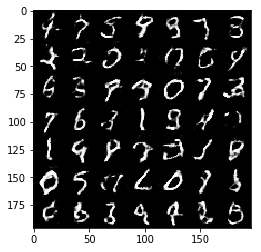

Epoch 2/2... Discriminator Loss: 0.4700... Generator Loss: 1.7096
Epoch 2/2... Discriminator Loss: 0.7125... Generator Loss: 0.9705
Epoch 2/2... Discriminator Loss: 0.8123... Generator Loss: 0.7880
Epoch 2/2... Discriminator Loss: 0.7081... Generator Loss: 0.9482
Epoch 2/2... Discriminator Loss: 0.8087... Generator Loss: 0.7461
Epoch 2/2... Discriminator Loss: 0.4923... Generator Loss: 1.3584
Epoch 2/2... Discriminator Loss: 0.6554... Generator Loss: 1.0209


In [37]:
batch_size = 64
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch 1/1... Discriminator Loss: 1.7322... Generator Loss: 0.3637
Epoch 1/1... Discriminator Loss: 1.1612... Generator Loss: 0.6101
Epoch 1/1... Discriminator Loss: 1.3951... Generator Loss: 0.4675
Epoch 1/1... Discriminator Loss: 0.7731... Generator Loss: 0.8975
Epoch 1/1... Discriminator Loss: 0.7130... Generator Loss: 0.9265
Epoch 1/1... Discriminator Loss: 0.6297... Generator Loss: 1.0116
Epoch 1/1... Discriminator Loss: 1.0257... Generator Loss: 0.7146
Epoch 1/1... Discriminator Loss: 1.0101... Generator Loss: 1.6732
Epoch 1/1... Discriminator Loss: 1.1455... Generator Loss: 0.7647
Epoch 1/1... Discriminator Loss: 1.0671... Generator Loss: 0.6455


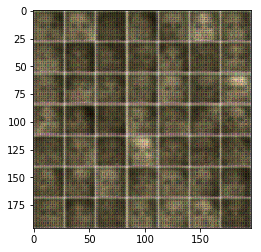

Epoch 1/1... Discriminator Loss: 1.2431... Generator Loss: 0.6227
Epoch 1/1... Discriminator Loss: 0.7491... Generator Loss: 1.2794
Epoch 1/1... Discriminator Loss: 1.4479... Generator Loss: 0.4980
Epoch 1/1... Discriminator Loss: 0.8220... Generator Loss: 1.4246
Epoch 1/1... Discriminator Loss: 1.3674... Generator Loss: 0.5606
Epoch 1/1... Discriminator Loss: 1.3072... Generator Loss: 0.5283
Epoch 1/1... Discriminator Loss: 1.5076... Generator Loss: 0.4010
Epoch 1/1... Discriminator Loss: 0.9639... Generator Loss: 1.0202
Epoch 1/1... Discriminator Loss: 1.0521... Generator Loss: 0.7746
Epoch 1/1... Discriminator Loss: 1.2565... Generator Loss: 0.7302


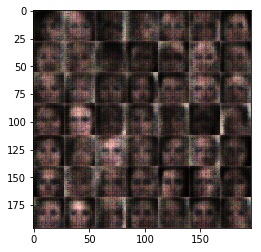

Epoch 1/1... Discriminator Loss: 0.9244... Generator Loss: 1.4750
Epoch 1/1... Discriminator Loss: 0.6729... Generator Loss: 1.1718
Epoch 1/1... Discriminator Loss: 1.0462... Generator Loss: 0.8618
Epoch 1/1... Discriminator Loss: 1.1119... Generator Loss: 0.8225
Epoch 1/1... Discriminator Loss: 1.2882... Generator Loss: 0.9139
Epoch 1/1... Discriminator Loss: 1.2333... Generator Loss: 0.6299
Epoch 1/1... Discriminator Loss: 0.8920... Generator Loss: 0.9880
Epoch 1/1... Discriminator Loss: 0.8937... Generator Loss: 0.8991
Epoch 1/1... Discriminator Loss: 0.9146... Generator Loss: 1.4510
Epoch 1/1... Discriminator Loss: 1.3205... Generator Loss: 0.4708


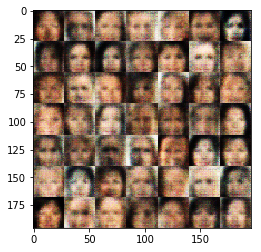

Epoch 1/1... Discriminator Loss: 1.1514... Generator Loss: 0.6612
Epoch 1/1... Discriminator Loss: 1.0361... Generator Loss: 0.8955
Epoch 1/1... Discriminator Loss: 1.2589... Generator Loss: 0.5502
Epoch 1/1... Discriminator Loss: 1.8096... Generator Loss: 0.2450
Epoch 1/1... Discriminator Loss: 1.1025... Generator Loss: 0.6140
Epoch 1/1... Discriminator Loss: 1.0433... Generator Loss: 0.6261
Epoch 1/1... Discriminator Loss: 0.8672... Generator Loss: 1.0417
Epoch 1/1... Discriminator Loss: 0.8473... Generator Loss: 1.2002
Epoch 1/1... Discriminator Loss: 1.2982... Generator Loss: 0.4430
Epoch 1/1... Discriminator Loss: 0.9134... Generator Loss: 1.1510


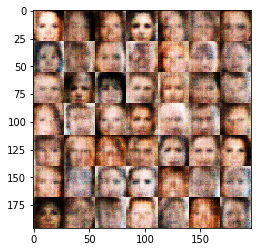

Epoch 1/1... Discriminator Loss: 0.8402... Generator Loss: 1.1765
Epoch 1/1... Discriminator Loss: 0.9452... Generator Loss: 0.7306
Epoch 1/1... Discriminator Loss: 1.0633... Generator Loss: 0.6060
Epoch 1/1... Discriminator Loss: 1.1417... Generator Loss: 0.7501
Epoch 1/1... Discriminator Loss: 0.8097... Generator Loss: 1.1722
Epoch 1/1... Discriminator Loss: 1.9528... Generator Loss: 0.2290
Epoch 1/1... Discriminator Loss: 0.9864... Generator Loss: 0.7809
Epoch 1/1... Discriminator Loss: 1.2728... Generator Loss: 0.5859
Epoch 1/1... Discriminator Loss: 0.5725... Generator Loss: 1.3745
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 0.4414


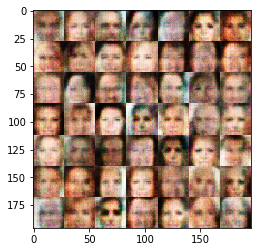

Epoch 1/1... Discriminator Loss: 1.2544... Generator Loss: 0.7000
Epoch 1/1... Discriminator Loss: 0.8522... Generator Loss: 1.8392
Epoch 1/1... Discriminator Loss: 1.5414... Generator Loss: 0.6995
Epoch 1/1... Discriminator Loss: 0.8121... Generator Loss: 1.0896
Epoch 1/1... Discriminator Loss: 0.8466... Generator Loss: 0.8549
Epoch 1/1... Discriminator Loss: 1.2041... Generator Loss: 0.6939
Epoch 1/1... Discriminator Loss: 0.9327... Generator Loss: 0.8043
Epoch 1/1... Discriminator Loss: 0.8707... Generator Loss: 1.4432
Epoch 1/1... Discriminator Loss: 1.2871... Generator Loss: 0.5662
Epoch 1/1... Discriminator Loss: 1.2577... Generator Loss: 0.6290


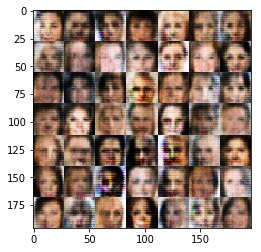

Epoch 1/1... Discriminator Loss: 1.1957... Generator Loss: 0.8063
Epoch 1/1... Discriminator Loss: 1.2295... Generator Loss: 0.9926
Epoch 1/1... Discriminator Loss: 1.8329... Generator Loss: 0.9116
Epoch 1/1... Discriminator Loss: 1.4441... Generator Loss: 0.8948
Epoch 1/1... Discriminator Loss: 1.1918... Generator Loss: 0.7105
Epoch 1/1... Discriminator Loss: 1.4586... Generator Loss: 0.4508
Epoch 1/1... Discriminator Loss: 1.0441... Generator Loss: 0.8067
Epoch 1/1... Discriminator Loss: 1.3743... Generator Loss: 0.5196
Epoch 1/1... Discriminator Loss: 1.3074... Generator Loss: 0.5678
Epoch 1/1... Discriminator Loss: 0.9405... Generator Loss: 0.9081


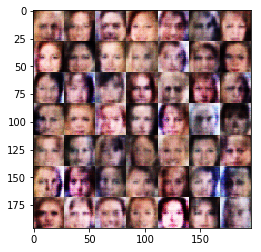

Epoch 1/1... Discriminator Loss: 1.0433... Generator Loss: 0.8002
Epoch 1/1... Discriminator Loss: 1.3312... Generator Loss: 0.5434
Epoch 1/1... Discriminator Loss: 1.2310... Generator Loss: 1.1556
Epoch 1/1... Discriminator Loss: 1.2364... Generator Loss: 0.7603
Epoch 1/1... Discriminator Loss: 1.1556... Generator Loss: 0.8744
Epoch 1/1... Discriminator Loss: 1.1334... Generator Loss: 0.8319
Epoch 1/1... Discriminator Loss: 1.1836... Generator Loss: 0.7896
Epoch 1/1... Discriminator Loss: 1.0913... Generator Loss: 1.5937
Epoch 1/1... Discriminator Loss: 1.0802... Generator Loss: 0.7564
Epoch 1/1... Discriminator Loss: 1.1742... Generator Loss: 0.9103


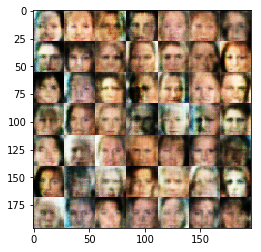

Epoch 1/1... Discriminator Loss: 1.2395... Generator Loss: 0.6438
Epoch 1/1... Discriminator Loss: 1.0364... Generator Loss: 0.9436
Epoch 1/1... Discriminator Loss: 1.3901... Generator Loss: 0.7433
Epoch 1/1... Discriminator Loss: 0.9903... Generator Loss: 0.7559
Epoch 1/1... Discriminator Loss: 1.3238... Generator Loss: 0.5070
Epoch 1/1... Discriminator Loss: 1.2118... Generator Loss: 0.7621
Epoch 1/1... Discriminator Loss: 1.2082... Generator Loss: 0.8011
Epoch 1/1... Discriminator Loss: 1.2031... Generator Loss: 0.7173
Epoch 1/1... Discriminator Loss: 1.1011... Generator Loss: 0.8133
Epoch 1/1... Discriminator Loss: 1.2643... Generator Loss: 0.8340


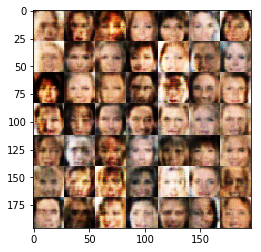

Epoch 1/1... Discriminator Loss: 1.2310... Generator Loss: 0.7267
Epoch 1/1... Discriminator Loss: 1.0337... Generator Loss: 0.9397
Epoch 1/1... Discriminator Loss: 1.2226... Generator Loss: 0.6974
Epoch 1/1... Discriminator Loss: 0.9877... Generator Loss: 0.7691
Epoch 1/1... Discriminator Loss: 1.1199... Generator Loss: 0.7963
Epoch 1/1... Discriminator Loss: 1.2797... Generator Loss: 1.3603
Epoch 1/1... Discriminator Loss: 1.1097... Generator Loss: 0.7827
Epoch 1/1... Discriminator Loss: 0.9217... Generator Loss: 0.9843
Epoch 1/1... Discriminator Loss: 1.0726... Generator Loss: 0.8666
Epoch 1/1... Discriminator Loss: 1.1993... Generator Loss: 1.2378


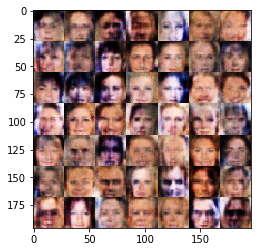

Epoch 1/1... Discriminator Loss: 1.1485... Generator Loss: 0.6824
Epoch 1/1... Discriminator Loss: 1.1029... Generator Loss: 0.9245
Epoch 1/1... Discriminator Loss: 1.1639... Generator Loss: 0.6029
Epoch 1/1... Discriminator Loss: 1.1719... Generator Loss: 0.9518
Epoch 1/1... Discriminator Loss: 1.1375... Generator Loss: 0.7312
Epoch 1/1... Discriminator Loss: 0.9767... Generator Loss: 0.8024
Epoch 1/1... Discriminator Loss: 1.2334... Generator Loss: 0.6632
Epoch 1/1... Discriminator Loss: 1.2666... Generator Loss: 1.0588
Epoch 1/1... Discriminator Loss: 1.1372... Generator Loss: 0.6396
Epoch 1/1... Discriminator Loss: 1.4130... Generator Loss: 0.4446


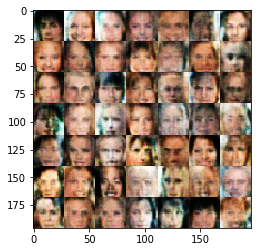

Epoch 1/1... Discriminator Loss: 1.0838... Generator Loss: 0.7743
Epoch 1/1... Discriminator Loss: 1.1829... Generator Loss: 0.5791
Epoch 1/1... Discriminator Loss: 1.2205... Generator Loss: 0.6158
Epoch 1/1... Discriminator Loss: 1.0686... Generator Loss: 0.8236
Epoch 1/1... Discriminator Loss: 0.9891... Generator Loss: 1.0220
Epoch 1/1... Discriminator Loss: 1.0427... Generator Loss: 1.0038
Epoch 1/1... Discriminator Loss: 0.8522... Generator Loss: 0.8743
Epoch 1/1... Discriminator Loss: 1.0937... Generator Loss: 0.7812
Epoch 1/1... Discriminator Loss: 1.1429... Generator Loss: 0.8587
Epoch 1/1... Discriminator Loss: 1.1018... Generator Loss: 0.7425


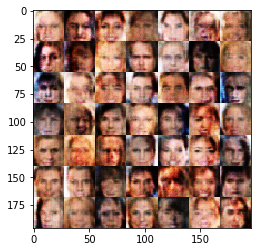

Epoch 1/1... Discriminator Loss: 0.9788... Generator Loss: 0.8621
Epoch 1/1... Discriminator Loss: 1.1032... Generator Loss: 0.6349
Epoch 1/1... Discriminator Loss: 1.2241... Generator Loss: 0.6295
Epoch 1/1... Discriminator Loss: 1.1565... Generator Loss: 1.1077
Epoch 1/1... Discriminator Loss: 1.0493... Generator Loss: 0.7605
Epoch 1/1... Discriminator Loss: 1.1105... Generator Loss: 0.6580
Epoch 1/1... Discriminator Loss: 1.1813... Generator Loss: 0.5853
Epoch 1/1... Discriminator Loss: 1.1016... Generator Loss: 1.0215
Epoch 1/1... Discriminator Loss: 0.9262... Generator Loss: 0.8957
Epoch 1/1... Discriminator Loss: 1.1270... Generator Loss: 0.7865


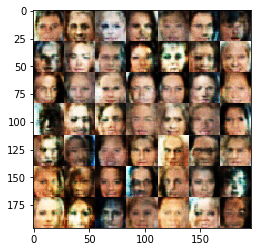

Epoch 1/1... Discriminator Loss: 1.0586... Generator Loss: 0.9995
Epoch 1/1... Discriminator Loss: 1.0959... Generator Loss: 0.7522
Epoch 1/1... Discriminator Loss: 0.9959... Generator Loss: 0.6347
Epoch 1/1... Discriminator Loss: 1.3659... Generator Loss: 0.4239
Epoch 1/1... Discriminator Loss: 0.9383... Generator Loss: 0.8812
Epoch 1/1... Discriminator Loss: 1.5023... Generator Loss: 0.3810
Epoch 1/1... Discriminator Loss: 0.8862... Generator Loss: 0.9953
Epoch 1/1... Discriminator Loss: 1.1597... Generator Loss: 0.5388
Epoch 1/1... Discriminator Loss: 1.6216... Generator Loss: 0.3323
Epoch 1/1... Discriminator Loss: 1.1319... Generator Loss: 0.6771


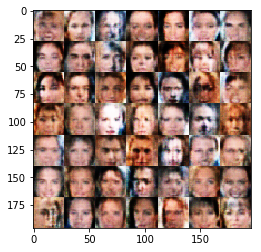

Epoch 1/1... Discriminator Loss: 1.4128... Generator Loss: 0.7842
Epoch 1/1... Discriminator Loss: 1.0009... Generator Loss: 0.8386
Epoch 1/1... Discriminator Loss: 0.7981... Generator Loss: 0.9178
Epoch 1/1... Discriminator Loss: 1.1995... Generator Loss: 0.7421
Epoch 1/1... Discriminator Loss: 0.7291... Generator Loss: 1.2070
Epoch 1/1... Discriminator Loss: 1.2935... Generator Loss: 0.4853
Epoch 1/1... Discriminator Loss: 0.5340... Generator Loss: 2.1632
Epoch 1/1... Discriminator Loss: 1.1087... Generator Loss: 0.6748
Epoch 1/1... Discriminator Loss: 1.5260... Generator Loss: 0.3694
Epoch 1/1... Discriminator Loss: 0.7372... Generator Loss: 0.9413


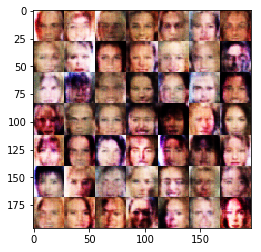

Epoch 1/1... Discriminator Loss: 0.5081... Generator Loss: 2.2092
Epoch 1/1... Discriminator Loss: 1.2071... Generator Loss: 0.5112
Epoch 1/1... Discriminator Loss: 1.2451... Generator Loss: 0.4580
Epoch 1/1... Discriminator Loss: 0.6457... Generator Loss: 1.6913
Epoch 1/1... Discriminator Loss: 0.2666... Generator Loss: 2.8053
Epoch 1/1... Discriminator Loss: 0.7516... Generator Loss: 1.0200
Epoch 1/1... Discriminator Loss: 1.0795... Generator Loss: 0.9976
Epoch 1/1... Discriminator Loss: 1.1852... Generator Loss: 0.5596
Epoch 1/1... Discriminator Loss: 0.6742... Generator Loss: 1.4835
Epoch 1/1... Discriminator Loss: 0.9708... Generator Loss: 1.3926


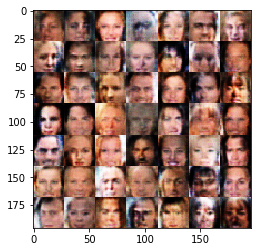

Epoch 1/1... Discriminator Loss: 1.3303... Generator Loss: 0.4430
Epoch 1/1... Discriminator Loss: 0.7037... Generator Loss: 1.5606
Epoch 1/1... Discriminator Loss: 1.2666... Generator Loss: 0.4265
Epoch 1/1... Discriminator Loss: 2.3881... Generator Loss: 0.1323
Epoch 1/1... Discriminator Loss: 1.2816... Generator Loss: 0.9939
Epoch 1/1... Discriminator Loss: 1.2876... Generator Loss: 0.4772
Epoch 1/1... Discriminator Loss: 0.6314... Generator Loss: 1.1724
Epoch 1/1... Discriminator Loss: 0.6255... Generator Loss: 2.1118
Epoch 1/1... Discriminator Loss: 1.0437... Generator Loss: 0.6427
Epoch 1/1... Discriminator Loss: 0.6031... Generator Loss: 1.2746


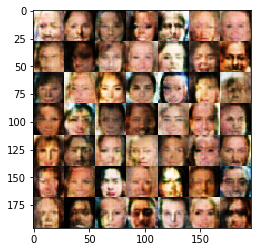

Epoch 1/1... Discriminator Loss: 0.9016... Generator Loss: 1.7970
Epoch 1/1... Discriminator Loss: 1.2746... Generator Loss: 0.5388
Epoch 1/1... Discriminator Loss: 0.5802... Generator Loss: 1.1840
Epoch 1/1... Discriminator Loss: 0.8510... Generator Loss: 1.4283
Epoch 1/1... Discriminator Loss: 1.1340... Generator Loss: 0.6088
Epoch 1/1... Discriminator Loss: 1.0099... Generator Loss: 0.9717
Epoch 1/1... Discriminator Loss: 1.2775... Generator Loss: 0.7747
Epoch 1/1... Discriminator Loss: 1.0545... Generator Loss: 0.8244
Epoch 1/1... Discriminator Loss: 0.9475... Generator Loss: 1.0320
Epoch 1/1... Discriminator Loss: 0.7834... Generator Loss: 1.3169


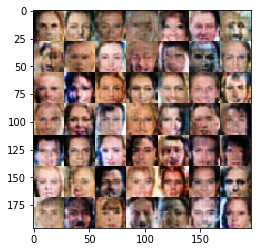

Epoch 1/1... Discriminator Loss: 0.5428... Generator Loss: 1.9055
Epoch 1/1... Discriminator Loss: 0.7885... Generator Loss: 1.3030
Epoch 1/1... Discriminator Loss: 0.7879... Generator Loss: 1.4029
Epoch 1/1... Discriminator Loss: 1.1569... Generator Loss: 0.5513
Epoch 1/1... Discriminator Loss: 1.0182... Generator Loss: 0.7445
Epoch 1/1... Discriminator Loss: 1.6083... Generator Loss: 0.3055
Epoch 1/1... Discriminator Loss: 1.2599... Generator Loss: 0.5402
Epoch 1/1... Discriminator Loss: 0.9116... Generator Loss: 0.7233
Epoch 1/1... Discriminator Loss: 1.3144... Generator Loss: 0.4355
Epoch 1/1... Discriminator Loss: 1.2255... Generator Loss: 1.2101


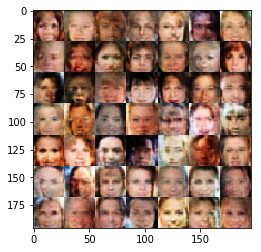

Epoch 1/1... Discriminator Loss: 0.9687... Generator Loss: 0.9431
Epoch 1/1... Discriminator Loss: 0.7269... Generator Loss: 1.8423
Epoch 1/1... Discriminator Loss: 0.6381... Generator Loss: 1.9907
Epoch 1/1... Discriminator Loss: 1.6336... Generator Loss: 0.2713
Epoch 1/1... Discriminator Loss: 0.8689... Generator Loss: 0.8658
Epoch 1/1... Discriminator Loss: 0.4411... Generator Loss: 1.8451
Epoch 1/1... Discriminator Loss: 1.5864... Generator Loss: 0.3009
Epoch 1/1... Discriminator Loss: 0.8500... Generator Loss: 1.3828
Epoch 1/1... Discriminator Loss: 0.4770... Generator Loss: 1.8658
Epoch 1/1... Discriminator Loss: 1.3598... Generator Loss: 0.4292


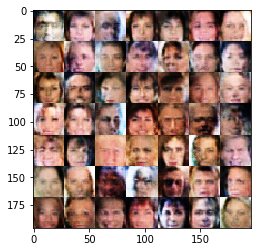

Epoch 1/1... Discriminator Loss: 0.6174... Generator Loss: 1.9153
Epoch 1/1... Discriminator Loss: 0.9522... Generator Loss: 0.6538
Epoch 1/1... Discriminator Loss: 0.4046... Generator Loss: 2.5021
Epoch 1/1... Discriminator Loss: 1.9165... Generator Loss: 0.1991
Epoch 1/1... Discriminator Loss: 0.9125... Generator Loss: 1.5124
Epoch 1/1... Discriminator Loss: 1.3821... Generator Loss: 0.4051
Epoch 1/1... Discriminator Loss: 1.2169... Generator Loss: 0.5541
Epoch 1/1... Discriminator Loss: 0.8706... Generator Loss: 0.8601
Epoch 1/1... Discriminator Loss: 1.1719... Generator Loss: 0.5503
Epoch 1/1... Discriminator Loss: 0.6848... Generator Loss: 1.2426


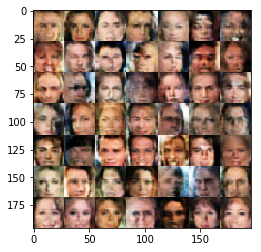

Epoch 1/1... Discriminator Loss: 0.7703... Generator Loss: 1.1961
Epoch 1/1... Discriminator Loss: 1.0201... Generator Loss: 0.6306
Epoch 1/1... Discriminator Loss: 0.8479... Generator Loss: 1.1830
Epoch 1/1... Discriminator Loss: 0.7632... Generator Loss: 1.2421
Epoch 1/1... Discriminator Loss: 0.7110... Generator Loss: 1.1825
Epoch 1/1... Discriminator Loss: 1.5433... Generator Loss: 0.3381
Epoch 1/1... Discriminator Loss: 1.0564... Generator Loss: 0.8377
Epoch 1/1... Discriminator Loss: 1.8318... Generator Loss: 0.2643
Epoch 1/1... Discriminator Loss: 1.1117... Generator Loss: 0.7328
Epoch 1/1... Discriminator Loss: 0.9557... Generator Loss: 0.7789


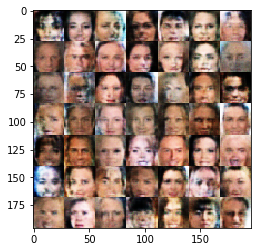

Epoch 1/1... Discriminator Loss: 1.1983... Generator Loss: 0.7368
Epoch 1/1... Discriminator Loss: 0.8173... Generator Loss: 1.1954
Epoch 1/1... Discriminator Loss: 0.5253... Generator Loss: 1.7603
Epoch 1/1... Discriminator Loss: 1.3612... Generator Loss: 0.4499
Epoch 1/1... Discriminator Loss: 0.5587... Generator Loss: 1.1319
Epoch 1/1... Discriminator Loss: 0.6329... Generator Loss: 1.4417
Epoch 1/1... Discriminator Loss: 0.5474... Generator Loss: 1.4059
Epoch 1/1... Discriminator Loss: 0.9215... Generator Loss: 0.8374
Epoch 1/1... Discriminator Loss: 0.6639... Generator Loss: 2.6400
Epoch 1/1... Discriminator Loss: 0.4222... Generator Loss: 2.4232


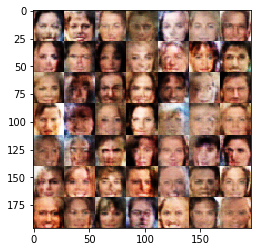

Epoch 1/1... Discriminator Loss: 1.7780... Generator Loss: 0.2345
Epoch 1/1... Discriminator Loss: 1.0829... Generator Loss: 0.6038
Epoch 1/1... Discriminator Loss: 0.7834... Generator Loss: 0.8269
Epoch 1/1... Discriminator Loss: 0.3150... Generator Loss: 2.2311
Epoch 1/1... Discriminator Loss: 0.6943... Generator Loss: 1.4552
Epoch 1/1... Discriminator Loss: 0.7607... Generator Loss: 1.1814
Epoch 1/1... Discriminator Loss: 1.3583... Generator Loss: 0.4865
Epoch 1/1... Discriminator Loss: 1.1864... Generator Loss: 0.5617
Epoch 1/1... Discriminator Loss: 1.1032... Generator Loss: 1.1062
Epoch 1/1... Discriminator Loss: 0.9011... Generator Loss: 0.7504


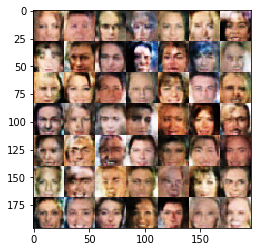

Epoch 1/1... Discriminator Loss: 1.2953... Generator Loss: 0.4622
Epoch 1/1... Discriminator Loss: 0.9139... Generator Loss: 1.0330
Epoch 1/1... Discriminator Loss: 1.0822... Generator Loss: 0.6294
Epoch 1/1... Discriminator Loss: 1.0439... Generator Loss: 0.5788
Epoch 1/1... Discriminator Loss: 0.6163... Generator Loss: 1.1975
Epoch 1/1... Discriminator Loss: 1.2971... Generator Loss: 1.4160
Epoch 1/1... Discriminator Loss: 1.0725... Generator Loss: 0.9786
Epoch 1/1... Discriminator Loss: 1.1887... Generator Loss: 0.4953
Epoch 1/1... Discriminator Loss: 0.6097... Generator Loss: 2.0338
Epoch 1/1... Discriminator Loss: 0.5041... Generator Loss: 1.9694


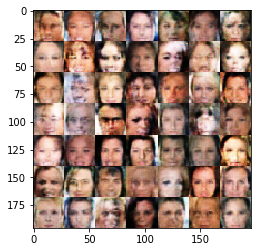

Epoch 1/1... Discriminator Loss: 0.8568... Generator Loss: 1.4386
Epoch 1/1... Discriminator Loss: 1.0096... Generator Loss: 0.8830
Epoch 1/1... Discriminator Loss: 0.8352... Generator Loss: 1.1236
Epoch 1/1... Discriminator Loss: 0.9175... Generator Loss: 0.7639
Epoch 1/1... Discriminator Loss: 0.8957... Generator Loss: 0.9161
Epoch 1/1... Discriminator Loss: 1.4015... Generator Loss: 0.3767
Epoch 1/1... Discriminator Loss: 0.3217... Generator Loss: 2.9190
Epoch 1/1... Discriminator Loss: 0.6215... Generator Loss: 2.0815
Epoch 1/1... Discriminator Loss: 0.3285... Generator Loss: 1.7335
Epoch 1/1... Discriminator Loss: 0.4380... Generator Loss: 1.5906


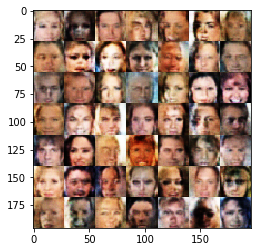

Epoch 1/1... Discriminator Loss: 0.4253... Generator Loss: 3.8684
Epoch 1/1... Discriminator Loss: 1.1869... Generator Loss: 0.5315
Epoch 1/1... Discriminator Loss: 0.5246... Generator Loss: 1.7013
Epoch 1/1... Discriminator Loss: 0.3095... Generator Loss: 3.4859
Epoch 1/1... Discriminator Loss: 0.6259... Generator Loss: 1.3531
Epoch 1/1... Discriminator Loss: 0.7045... Generator Loss: 1.7911
Epoch 1/1... Discriminator Loss: 0.3646... Generator Loss: 4.1872
Epoch 1/1... Discriminator Loss: 0.4359... Generator Loss: 1.3744
Epoch 1/1... Discriminator Loss: 0.1953... Generator Loss: 3.9429
Epoch 1/1... Discriminator Loss: 0.2729... Generator Loss: 2.0551


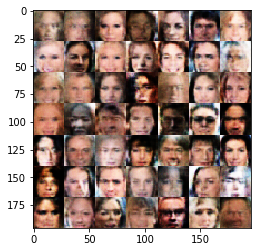

Epoch 1/1... Discriminator Loss: 0.3362... Generator Loss: 1.9673
Epoch 1/1... Discriminator Loss: 0.2724... Generator Loss: 4.5777
Epoch 1/1... Discriminator Loss: 0.3056... Generator Loss: 3.4828
Epoch 1/1... Discriminator Loss: 0.3337... Generator Loss: 3.5462
Epoch 1/1... Discriminator Loss: 0.4765... Generator Loss: 2.9133
Epoch 1/1... Discriminator Loss: 0.3340... Generator Loss: 1.9858
Epoch 1/1... Discriminator Loss: 0.3787... Generator Loss: 2.7696
Epoch 1/1... Discriminator Loss: 0.6933... Generator Loss: 0.8650
Epoch 1/1... Discriminator Loss: 0.2899... Generator Loss: 3.5772
Epoch 1/1... Discriminator Loss: 0.2572... Generator Loss: 2.8993


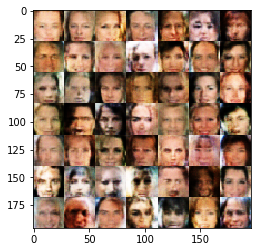

Epoch 1/1... Discriminator Loss: 0.3175... Generator Loss: 1.8821
Epoch 1/1... Discriminator Loss: 0.2174... Generator Loss: 3.4537
Epoch 1/1... Discriminator Loss: 0.8552... Generator Loss: 5.0401
Epoch 1/1... Discriminator Loss: 0.3553... Generator Loss: 2.1051
Epoch 1/1... Discriminator Loss: 0.0988... Generator Loss: 4.9877
Epoch 1/1... Discriminator Loss: 0.8898... Generator Loss: 0.7756
Epoch 1/1... Discriminator Loss: 0.6523... Generator Loss: 0.9217
Epoch 1/1... Discriminator Loss: 0.5238... Generator Loss: 1.2095
Epoch 1/1... Discriminator Loss: 0.1146... Generator Loss: 3.0350
Epoch 1/1... Discriminator Loss: 0.2881... Generator Loss: 1.6385


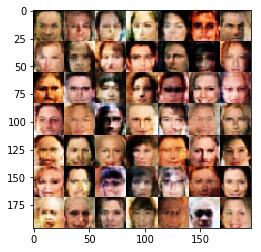

Epoch 1/1... Discriminator Loss: 0.7800... Generator Loss: 0.7576
Epoch 1/1... Discriminator Loss: 0.3313... Generator Loss: 1.7216
Epoch 1/1... Discriminator Loss: 1.0116... Generator Loss: 0.5947
Epoch 1/1... Discriminator Loss: 0.9767... Generator Loss: 0.5942
Epoch 1/1... Discriminator Loss: 2.6275... Generator Loss: 0.1020
Epoch 1/1... Discriminator Loss: 0.1281... Generator Loss: 4.6752
Epoch 1/1... Discriminator Loss: 0.1489... Generator Loss: 3.0678
Epoch 1/1... Discriminator Loss: 0.0606... Generator Loss: 4.2615
Epoch 1/1... Discriminator Loss: 0.1130... Generator Loss: 2.8948
Epoch 1/1... Discriminator Loss: 0.2843... Generator Loss: 6.3812


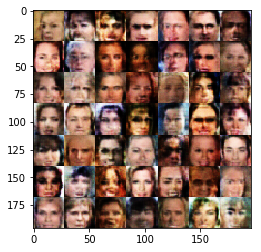

Epoch 1/1... Discriminator Loss: 0.1327... Generator Loss: 8.6072
Epoch 1/1... Discriminator Loss: 0.1873... Generator Loss: 2.2260
Epoch 1/1... Discriminator Loss: 0.8095... Generator Loss: 0.7915
Epoch 1/1... Discriminator Loss: 0.1091... Generator Loss: 3.7556
Epoch 1/1... Discriminator Loss: 0.1801... Generator Loss: 3.0998
Epoch 1/1... Discriminator Loss: 0.2260... Generator Loss: 4.3437
Epoch 1/1... Discriminator Loss: 1.2951... Generator Loss: 0.3979
Epoch 1/1... Discriminator Loss: 0.2591... Generator Loss: 4.2269
Epoch 1/1... Discriminator Loss: 0.1667... Generator Loss: 8.1953
Epoch 1/1... Discriminator Loss: 0.1248... Generator Loss: 3.8160


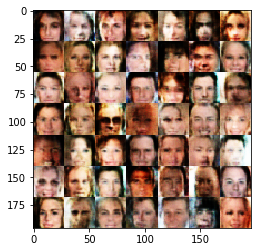

Epoch 1/1... Discriminator Loss: 0.7007... Generator Loss: 0.8288
Epoch 1/1... Discriminator Loss: 0.5371... Generator Loss: 1.1993
Epoch 1/1... Discriminator Loss: 0.2133... Generator Loss: 6.6626
Epoch 1/1... Discriminator Loss: 0.2338... Generator Loss: 2.0539
Epoch 1/1... Discriminator Loss: 0.1012... Generator Loss: 6.2487
Epoch 1/1... Discriminator Loss: 0.2965... Generator Loss: 7.6312
Epoch 1/1... Discriminator Loss: 2.0498... Generator Loss: 0.1801
Epoch 1/1... Discriminator Loss: 1.2638... Generator Loss: 0.4326
Epoch 1/1... Discriminator Loss: 0.0462... Generator Loss: 6.9811
Epoch 1/1... Discriminator Loss: 2.5306... Generator Loss: 0.1055


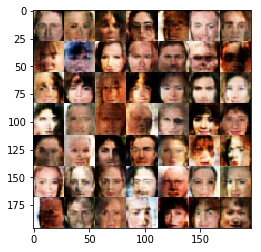

Epoch 1/1... Discriminator Loss: 0.1155... Generator Loss: 4.5933
Epoch 1/1... Discriminator Loss: 0.4958... Generator Loss: 1.2734
Epoch 1/1... Discriminator Loss: 0.1247... Generator Loss: 4.8036
Epoch 1/1... Discriminator Loss: 0.2523... Generator Loss: 2.2370
Epoch 1/1... Discriminator Loss: 0.5551... Generator Loss: 1.0900
Epoch 1/1... Discriminator Loss: 0.0704... Generator Loss: 5.2797
Epoch 1/1... Discriminator Loss: 0.1758... Generator Loss: 2.7906
Epoch 1/1... Discriminator Loss: 2.3676... Generator Loss: 0.1325
Epoch 1/1... Discriminator Loss: 0.2400... Generator Loss: 1.7680
Epoch 1/1... Discriminator Loss: 0.1285... Generator Loss: 4.1479


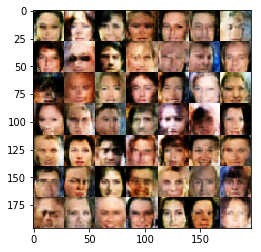

Epoch 1/1... Discriminator Loss: 0.1624... Generator Loss: 5.6601
Epoch 1/1... Discriminator Loss: 0.0142... Generator Loss: 6.9340
Epoch 1/1... Discriminator Loss: 0.6266... Generator Loss: 1.0628
Epoch 1/1... Discriminator Loss: 0.1134... Generator Loss: 2.9147
Epoch 1/1... Discriminator Loss: 0.1090... Generator Loss: 2.8116
Epoch 1/1... Discriminator Loss: 0.2465... Generator Loss: 8.2298
Epoch 1/1... Discriminator Loss: 0.0407... Generator Loss: 6.3569
Epoch 1/1... Discriminator Loss: 0.1463... Generator Loss: 5.9788
Epoch 1/1... Discriminator Loss: 0.1646... Generator Loss: 4.4538
Epoch 1/1... Discriminator Loss: 0.1320... Generator Loss: 2.7872


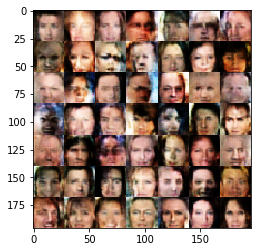

Epoch 1/1... Discriminator Loss: 0.0339... Generator Loss: 6.0784
Epoch 1/1... Discriminator Loss: 0.0465... Generator Loss: 4.0804
Epoch 1/1... Discriminator Loss: 0.1509... Generator Loss: 2.6450
Epoch 1/1... Discriminator Loss: 0.2426... Generator Loss: 2.2171
Epoch 1/1... Discriminator Loss: 0.0544... Generator Loss: 4.7934
Epoch 1/1... Discriminator Loss: 0.1410... Generator Loss: 2.5543
Epoch 1/1... Discriminator Loss: 0.0838... Generator Loss: 6.3725
Epoch 1/1... Discriminator Loss: 0.2209... Generator Loss: 1.8275
Epoch 1/1... Discriminator Loss: 0.1342... Generator Loss: 6.9926
Epoch 1/1... Discriminator Loss: 0.1224... Generator Loss: 3.1197


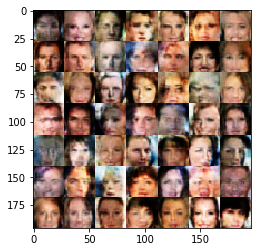

Epoch 1/1... Discriminator Loss: 0.0532... Generator Loss: 7.4919
Epoch 1/1... Discriminator Loss: 0.0300... Generator Loss: 7.6898
Epoch 1/1... Discriminator Loss: 0.0427... Generator Loss: 6.8819
Epoch 1/1... Discriminator Loss: 0.4082... Generator Loss: 1.4396
Epoch 1/1... Discriminator Loss: 0.0383... Generator Loss: 6.1937
Epoch 1/1... Discriminator Loss: 0.0649... Generator Loss: 3.3629
Epoch 1/1... Discriminator Loss: 0.0511... Generator Loss: 4.4521
Epoch 1/1... Discriminator Loss: 0.0259... Generator Loss: 6.0127
Epoch 1/1... Discriminator Loss: 0.6384... Generator Loss: 0.8932
Epoch 1/1... Discriminator Loss: 0.0934... Generator Loss: 2.7509


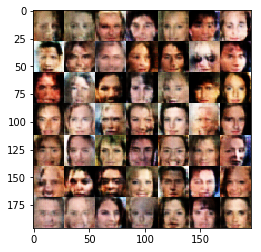

Epoch 1/1... Discriminator Loss: 0.2647... Generator Loss: 4.7974
Epoch 1/1... Discriminator Loss: 0.0824... Generator Loss: 3.0497
Epoch 1/1... Discriminator Loss: 0.0401... Generator Loss: 7.4635
Epoch 1/1... Discriminator Loss: 0.0678... Generator Loss: 3.7104
Epoch 1/1... Discriminator Loss: 0.1201... Generator Loss: 2.9807
Epoch 1/1... Discriminator Loss: 1.6310... Generator Loss: 0.2871
Epoch 1/1... Discriminator Loss: 0.1084... Generator Loss: 3.8162
Epoch 1/1... Discriminator Loss: 0.0538... Generator Loss: 4.4561
Epoch 1/1... Discriminator Loss: 0.1260... Generator Loss: 9.5355
Epoch 1/1... Discriminator Loss: 0.1567... Generator Loss: 7.4664


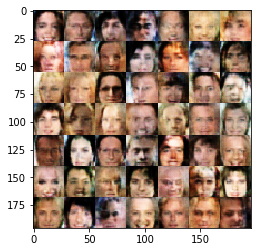

Epoch 1/1... Discriminator Loss: 0.3327... Generator Loss: 1.6104
Epoch 1/1... Discriminator Loss: 1.2100... Generator Loss: 8.5252
Epoch 1/1... Discriminator Loss: 0.3502... Generator Loss: 1.5524
Epoch 1/1... Discriminator Loss: 0.1223... Generator Loss: 5.4951
Epoch 1/1... Discriminator Loss: 0.0615... Generator Loss: 5.3460
Epoch 1/1... Discriminator Loss: 0.1205... Generator Loss: 6.7929
Epoch 1/1... Discriminator Loss: 0.1125... Generator Loss: 3.3348
Epoch 1/1... Discriminator Loss: 0.7094... Generator Loss: 0.8938
Epoch 1/1... Discriminator Loss: 0.1834... Generator Loss: 2.0781
Epoch 1/1... Discriminator Loss: 0.4407... Generator Loss: 1.3323


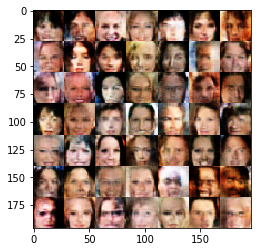

Epoch 1/1... Discriminator Loss: 0.0707... Generator Loss: 4.3650
Epoch 1/1... Discriminator Loss: 0.1806... Generator Loss: 2.3681
Epoch 1/1... Discriminator Loss: 0.0075... Generator Loss: 6.6017
Epoch 1/1... Discriminator Loss: 0.6146... Generator Loss: 1.0871
Epoch 1/1... Discriminator Loss: 0.0213... Generator Loss: 6.5126
Epoch 1/1... Discriminator Loss: 0.1643... Generator Loss: 2.5640
Epoch 1/1... Discriminator Loss: 1.8759... Generator Loss: 0.2064
Epoch 1/1... Discriminator Loss: 0.0388... Generator Loss: 4.5694
Epoch 1/1... Discriminator Loss: 0.3487... Generator Loss: 1.4979
Epoch 1/1... Discriminator Loss: 0.0445... Generator Loss: 4.5244


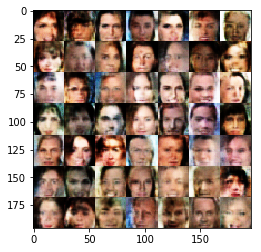

Epoch 1/1... Discriminator Loss: 0.3308... Generator Loss: 1.6407
Epoch 1/1... Discriminator Loss: 0.0169... Generator Loss: 7.1978
Epoch 1/1... Discriminator Loss: 0.3517... Generator Loss: 1.4945
Epoch 1/1... Discriminator Loss: 0.2787... Generator Loss: 13.3165
Epoch 1/1... Discriminator Loss: 0.1991... Generator Loss: 2.1657
Epoch 1/1... Discriminator Loss: 0.2537... Generator Loss: 1.9843
Epoch 1/1... Discriminator Loss: 0.1993... Generator Loss: 2.3913
Epoch 1/1... Discriminator Loss: 2.2636... Generator Loss: 0.1501
Epoch 1/1... Discriminator Loss: 0.1183... Generator Loss: 5.4355
Epoch 1/1... Discriminator Loss: 0.3459... Generator Loss: 1.5983


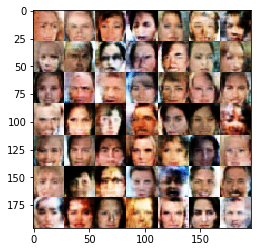

Epoch 1/1... Discriminator Loss: 0.1800... Generator Loss: 2.1951
Epoch 1/1... Discriminator Loss: 0.3557... Generator Loss: 1.4126
Epoch 1/1... Discriminator Loss: 0.1444... Generator Loss: 2.4845
Epoch 1/1... Discriminator Loss: 0.2094... Generator Loss: 3.3908
Epoch 1/1... Discriminator Loss: 0.0198... Generator Loss: 5.3839
Epoch 1/1... Discriminator Loss: 0.1270... Generator Loss: 3.2816
Epoch 1/1... Discriminator Loss: 0.0496... Generator Loss: 6.5468
Epoch 1/1... Discriminator Loss: 0.0399... Generator Loss: 7.7666
Epoch 1/1... Discriminator Loss: 0.1588... Generator Loss: 2.5148
Epoch 1/1... Discriminator Loss: 0.1226... Generator Loss: 8.5833


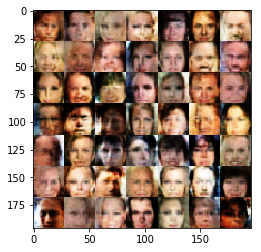

Epoch 1/1... Discriminator Loss: 0.0827... Generator Loss: 3.8264
Epoch 1/1... Discriminator Loss: 0.0890... Generator Loss: 6.2984
Epoch 1/1... Discriminator Loss: 0.0449... Generator Loss: 6.1435
Epoch 1/1... Discriminator Loss: 0.0733... Generator Loss: 6.4786
Epoch 1/1... Discriminator Loss: 0.0955... Generator Loss: 2.9056
Epoch 1/1... Discriminator Loss: 0.1969... Generator Loss: 5.0696
Epoch 1/1... Discriminator Loss: 0.0531... Generator Loss: 4.5351
Epoch 1/1... Discriminator Loss: 0.1796... Generator Loss: 8.0778
Epoch 1/1... Discriminator Loss: 1.1434... Generator Loss: 0.5150
Epoch 1/1... Discriminator Loss: 1.6145... Generator Loss: 0.3213


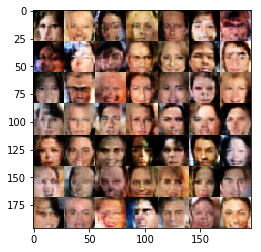

Epoch 1/1... Discriminator Loss: 0.2737... Generator Loss: 9.7835
Epoch 1/1... Discriminator Loss: 0.2959... Generator Loss: 1.6985
Epoch 1/1... Discriminator Loss: 0.3096... Generator Loss: 9.6881
Epoch 1/1... Discriminator Loss: 0.0321... Generator Loss: 7.2228
Epoch 1/1... Discriminator Loss: 0.0218... Generator Loss: 8.5820
Epoch 1/1... Discriminator Loss: 0.0991... Generator Loss: 7.9802
Epoch 1/1... Discriminator Loss: 0.1732... Generator Loss: 3.6585
Epoch 1/1... Discriminator Loss: 1.7645... Generator Loss: 0.2495
Epoch 1/1... Discriminator Loss: 0.4832... Generator Loss: 1.1926
Epoch 1/1... Discriminator Loss: 0.4356... Generator Loss: 1.2929


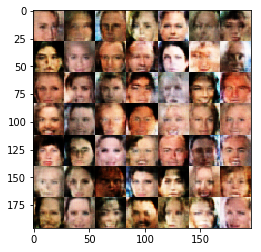

Epoch 1/1... Discriminator Loss: 0.2010... Generator Loss: 5.0731
Epoch 1/1... Discriminator Loss: 0.2890... Generator Loss: 1.8705
Epoch 1/1... Discriminator Loss: 0.5422... Generator Loss: 1.1367
Epoch 1/1... Discriminator Loss: 0.0523... Generator Loss: 4.4780
Epoch 1/1... Discriminator Loss: 0.4577... Generator Loss: 2.0934
Epoch 1/1... Discriminator Loss: 1.1738... Generator Loss: 0.5113
Epoch 1/1... Discriminator Loss: 0.1345... Generator Loss: 3.3002
Epoch 1/1... Discriminator Loss: 0.1510... Generator Loss: 7.5056
Epoch 1/1... Discriminator Loss: 0.0657... Generator Loss: 3.4283
Epoch 1/1... Discriminator Loss: 0.0696... Generator Loss: 4.5596


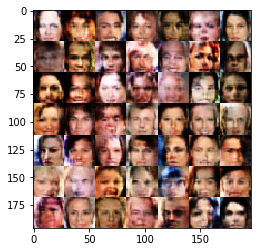

Epoch 1/1... Discriminator Loss: 0.0879... Generator Loss: 3.5043
Epoch 1/1... Discriminator Loss: 0.3002... Generator Loss: 1.9277
Epoch 1/1... Discriminator Loss: 0.1142... Generator Loss: 6.6098
Epoch 1/1... Discriminator Loss: 0.0535... Generator Loss: 10.2019
Epoch 1/1... Discriminator Loss: 0.0393... Generator Loss: 6.5482
Epoch 1/1... Discriminator Loss: 0.1265... Generator Loss: 4.6768
Epoch 1/1... Discriminator Loss: 0.2413... Generator Loss: 1.8308
Epoch 1/1... Discriminator Loss: 0.4049... Generator Loss: 9.7564
Epoch 1/1... Discriminator Loss: 0.4103... Generator Loss: 1.3005
Epoch 1/1... Discriminator Loss: 0.1240... Generator Loss: 4.8245


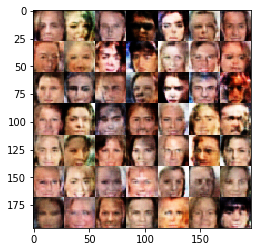

Epoch 1/1... Discriminator Loss: 0.0142... Generator Loss: 8.2754
Epoch 1/1... Discriminator Loss: 0.1285... Generator Loss: 2.5405
Epoch 1/1... Discriminator Loss: 0.4464... Generator Loss: 1.2541
Epoch 1/1... Discriminator Loss: 0.1178... Generator Loss: 3.0267
Epoch 1/1... Discriminator Loss: 1.8985... Generator Loss: 0.2170
Epoch 1/1... Discriminator Loss: 0.0309... Generator Loss: 8.7729
Epoch 1/1... Discriminator Loss: 0.0449... Generator Loss: 6.0493
Epoch 1/1... Discriminator Loss: 0.0463... Generator Loss: 7.5941
Epoch 1/1... Discriminator Loss: 0.1261... Generator Loss: 2.5869
Epoch 1/1... Discriminator Loss: 0.0387... Generator Loss: 4.0496


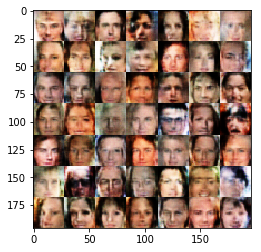

Epoch 1/1... Discriminator Loss: 1.2097... Generator Loss: 0.4128
Epoch 1/1... Discriminator Loss: 0.0411... Generator Loss: 5.4183
Epoch 1/1... Discriminator Loss: 0.1191... Generator Loss: 11.1425
Epoch 1/1... Discriminator Loss: 0.2042... Generator Loss: 3.5387
Epoch 1/1... Discriminator Loss: 0.0402... Generator Loss: 6.7453
Epoch 1/1... Discriminator Loss: 0.2538... Generator Loss: 5.9828
Epoch 1/1... Discriminator Loss: 0.2615... Generator Loss: 6.1892
Epoch 1/1... Discriminator Loss: 1.1969... Generator Loss: 0.4846
Epoch 1/1... Discriminator Loss: 0.0738... Generator Loss: 6.2114
Epoch 1/1... Discriminator Loss: 0.0493... Generator Loss: 4.2101


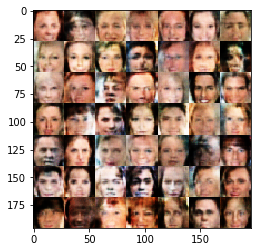

Epoch 1/1... Discriminator Loss: 0.0556... Generator Loss: 6.0457
Epoch 1/1... Discriminator Loss: 0.2256... Generator Loss: 7.9009
Epoch 1/1... Discriminator Loss: 0.1168... Generator Loss: 2.7211
Epoch 1/1... Discriminator Loss: 0.0265... Generator Loss: 5.9475
Epoch 1/1... Discriminator Loss: 0.0819... Generator Loss: 5.2272
Epoch 1/1... Discriminator Loss: 0.1425... Generator Loss: 9.8705
Epoch 1/1... Discriminator Loss: 0.0184... Generator Loss: 11.8661
Epoch 1/1... Discriminator Loss: 0.3074... Generator Loss: 7.7701
Epoch 1/1... Discriminator Loss: 0.0404... Generator Loss: 8.6932
Epoch 1/1... Discriminator Loss: 0.5973... Generator Loss: 0.9751


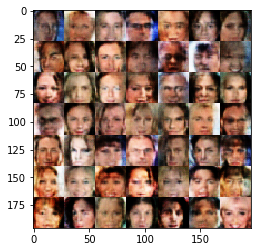

Epoch 1/1... Discriminator Loss: 0.0489... Generator Loss: 9.7858
Epoch 1/1... Discriminator Loss: 1.1043... Generator Loss: 0.4846
Epoch 1/1... Discriminator Loss: 0.1357... Generator Loss: 2.8456
Epoch 1/1... Discriminator Loss: 0.2953... Generator Loss: 1.7747
Epoch 1/1... Discriminator Loss: 0.0916... Generator Loss: 4.5871
Epoch 1/1... Discriminator Loss: 0.6631... Generator Loss: 0.8513
Epoch 1/1... Discriminator Loss: 2.0046... Generator Loss: 0.2159
Epoch 1/1... Discriminator Loss: 0.0251... Generator Loss: 9.1545
Epoch 1/1... Discriminator Loss: 0.3475... Generator Loss: 1.4751
Epoch 1/1... Discriminator Loss: 0.0492... Generator Loss: 10.2177


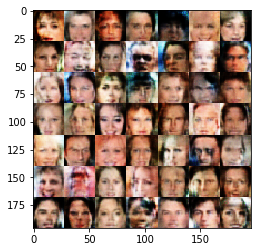

Epoch 1/1... Discriminator Loss: 0.0199... Generator Loss: 6.2790
Epoch 1/1... Discriminator Loss: 1.4442... Generator Loss: 6.4118
Epoch 1/1... Discriminator Loss: 0.0423... Generator Loss: 7.6973
Epoch 1/1... Discriminator Loss: 0.0715... Generator Loss: 3.9049
Epoch 1/1... Discriminator Loss: 0.5375... Generator Loss: 9.9190
Epoch 1/1... Discriminator Loss: 0.1205... Generator Loss: 3.4148
Epoch 1/1... Discriminator Loss: 0.0934... Generator Loss: 5.0328
Epoch 1/1... Discriminator Loss: 0.1597... Generator Loss: 2.6562
Epoch 1/1... Discriminator Loss: 0.0408... Generator Loss: 3.9890
Epoch 1/1... Discriminator Loss: 0.0573... Generator Loss: 4.3023


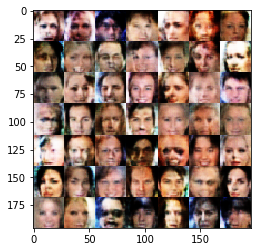

Epoch 1/1... Discriminator Loss: 0.1971... Generator Loss: 7.7313
Epoch 1/1... Discriminator Loss: 0.5118... Generator Loss: 1.2071
Epoch 1/1... Discriminator Loss: 0.0132... Generator Loss: 5.6203
Epoch 1/1... Discriminator Loss: 0.0853... Generator Loss: 3.0045
Epoch 1/1... Discriminator Loss: 0.0233... Generator Loss: 6.6014
Epoch 1/1... Discriminator Loss: 0.0371... Generator Loss: 6.3866
Epoch 1/1... Discriminator Loss: 0.0505... Generator Loss: 3.9724
Epoch 1/1... Discriminator Loss: 0.0239... Generator Loss: 5.2151
Epoch 1/1... Discriminator Loss: 0.8725... Generator Loss: 0.7284
Epoch 1/1... Discriminator Loss: 0.0467... Generator Loss: 6.1113


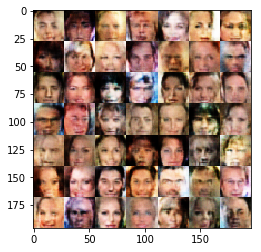

Epoch 1/1... Discriminator Loss: 1.7585... Generator Loss: 0.2615
Epoch 1/1... Discriminator Loss: 0.0025... Generator Loss: 10.2966
Epoch 1/1... Discriminator Loss: 0.0283... Generator Loss: 5.7238
Epoch 1/1... Discriminator Loss: 0.0404... Generator Loss: 6.9090
Epoch 1/1... Discriminator Loss: 0.0385... Generator Loss: 7.2930
Epoch 1/1... Discriminator Loss: 0.3244... Generator Loss: 1.7471
Epoch 1/1... Discriminator Loss: 0.0877... Generator Loss: 3.3681
Epoch 1/1... Discriminator Loss: 0.0284... Generator Loss: 5.3987
Epoch 1/1... Discriminator Loss: 0.4003... Generator Loss: 1.7482
Epoch 1/1... Discriminator Loss: 0.0430... Generator Loss: 5.5380


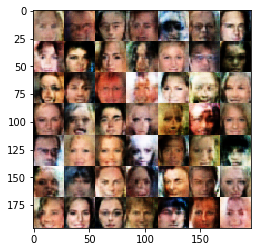

Epoch 1/1... Discriminator Loss: 3.9312... Generator Loss: 0.0383
Epoch 1/1... Discriminator Loss: 0.1118... Generator Loss: 2.7202
Epoch 1/1... Discriminator Loss: 0.0533... Generator Loss: 4.0222
Epoch 1/1... Discriminator Loss: 0.0856... Generator Loss: 8.0027
Epoch 1/1... Discriminator Loss: 0.1801... Generator Loss: 2.5160
Epoch 1/1... Discriminator Loss: 0.0416... Generator Loss: 8.6982
Epoch 1/1... Discriminator Loss: 0.0929... Generator Loss: 3.2787
Epoch 1/1... Discriminator Loss: 2.2962... Generator Loss: 0.1513
Epoch 1/1... Discriminator Loss: 0.0705... Generator Loss: 8.6212
Epoch 1/1... Discriminator Loss: 0.0444... Generator Loss: 6.2331


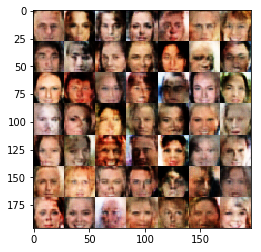

Epoch 1/1... Discriminator Loss: 0.0234... Generator Loss: 8.9871
Epoch 1/1... Discriminator Loss: 0.0581... Generator Loss: 3.6206
Epoch 1/1... Discriminator Loss: 0.0428... Generator Loss: 3.8553
Epoch 1/1... Discriminator Loss: 0.0066... Generator Loss: 10.9092
Epoch 1/1... Discriminator Loss: 0.0638... Generator Loss: 5.2875
Epoch 1/1... Discriminator Loss: 0.0648... Generator Loss: 3.8798
Epoch 1/1... Discriminator Loss: 0.7316... Generator Loss: 0.8016
Epoch 1/1... Discriminator Loss: 0.0975... Generator Loss: 3.1033
Epoch 1/1... Discriminator Loss: 0.0109... Generator Loss: 9.0650
Epoch 1/1... Discriminator Loss: 0.2960... Generator Loss: 2.4276


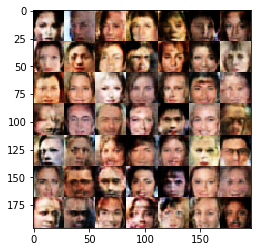

Epoch 1/1... Discriminator Loss: 0.0137... Generator Loss: 6.8219
Epoch 1/1... Discriminator Loss: 0.0154... Generator Loss: 6.3020
Epoch 1/1... Discriminator Loss: 0.0219... Generator Loss: 8.2289
Epoch 1/1... Discriminator Loss: 0.0389... Generator Loss: 6.3962
Epoch 1/1... Discriminator Loss: 0.6921... Generator Loss: 0.8157
Epoch 1/1... Discriminator Loss: 0.1169... Generator Loss: 2.6268
Epoch 1/1... Discriminator Loss: 0.0307... Generator Loss: 5.1508
Epoch 1/1... Discriminator Loss: 0.0345... Generator Loss: 7.2151
Epoch 1/1... Discriminator Loss: 0.0134... Generator Loss: 9.2466
Epoch 1/1... Discriminator Loss: 0.0315... Generator Loss: 7.7227


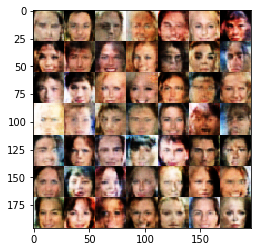

Epoch 1/1... Discriminator Loss: 0.1974... Generator Loss: 2.4675
Epoch 1/1... Discriminator Loss: 0.0981... Generator Loss: 3.0113
Epoch 1/1... Discriminator Loss: 0.0094... Generator Loss: 9.0629
Epoch 1/1... Discriminator Loss: 0.0116... Generator Loss: 8.2519
Epoch 1/1... Discriminator Loss: 0.0589... Generator Loss: 3.5926
Epoch 1/1... Discriminator Loss: 0.1576... Generator Loss: 2.5035
Epoch 1/1... Discriminator Loss: 0.0254... Generator Loss: 6.2238
Epoch 1/1... Discriminator Loss: 0.1637... Generator Loss: 2.4840
Epoch 1/1... Discriminator Loss: 0.0703... Generator Loss: 3.4906
Epoch 1/1... Discriminator Loss: 0.5865... Generator Loss: 1.1449


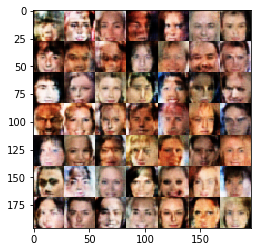

Epoch 1/1... Discriminator Loss: 0.2632... Generator Loss: 7.2208
Epoch 1/1... Discriminator Loss: 0.0093... Generator Loss: 5.6486
Epoch 1/1... Discriminator Loss: 0.0294... Generator Loss: 10.0070
Epoch 1/1... Discriminator Loss: 0.0346... Generator Loss: 7.6322
Epoch 1/1... Discriminator Loss: 0.0444... Generator Loss: 9.6697
Epoch 1/1... Discriminator Loss: 0.0183... Generator Loss: 11.2648
Epoch 1/1... Discriminator Loss: 0.4025... Generator Loss: 11.8031
Epoch 1/1... Discriminator Loss: 0.0589... Generator Loss: 4.4907
Epoch 1/1... Discriminator Loss: 0.0363... Generator Loss: 4.6152
Epoch 1/1... Discriminator Loss: 0.8546... Generator Loss: 7.9168


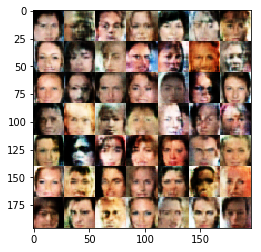

Epoch 1/1... Discriminator Loss: 0.0474... Generator Loss: 6.5117
Epoch 1/1... Discriminator Loss: 0.0477... Generator Loss: 6.3703
Epoch 1/1... Discriminator Loss: 0.0325... Generator Loss: 9.2349
Epoch 1/1... Discriminator Loss: 0.1881... Generator Loss: 2.1484
Epoch 1/1... Discriminator Loss: 0.0235... Generator Loss: 7.6648
Epoch 1/1... Discriminator Loss: 1.0369... Generator Loss: 0.5840
Epoch 1/1... Discriminator Loss: 0.0976... Generator Loss: 2.8902
Epoch 1/1... Discriminator Loss: 0.0529... Generator Loss: 4.5714
Epoch 1/1... Discriminator Loss: 0.0252... Generator Loss: 6.7334
Epoch 1/1... Discriminator Loss: 0.0480... Generator Loss: 7.8480


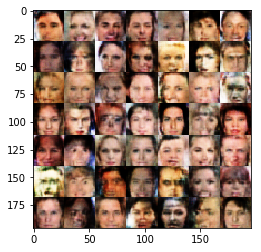

Epoch 1/1... Discriminator Loss: 0.0144... Generator Loss: 6.1495
Epoch 1/1... Discriminator Loss: 0.2214... Generator Loss: 2.0224
Epoch 1/1... Discriminator Loss: 0.0185... Generator Loss: 8.0548
Epoch 1/1... Discriminator Loss: 0.0165... Generator Loss: 5.1895
Epoch 1/1... Discriminator Loss: 0.1278... Generator Loss: 7.5666
Epoch 1/1... Discriminator Loss: 0.0601... Generator Loss: 5.7031
Epoch 1/1... Discriminator Loss: 0.0246... Generator Loss: 6.4211
Epoch 1/1... Discriminator Loss: 0.7718... Generator Loss: 0.7672
Epoch 1/1... Discriminator Loss: 0.0156... Generator Loss: 5.9146
Epoch 1/1... Discriminator Loss: 0.0449... Generator Loss: 5.7038


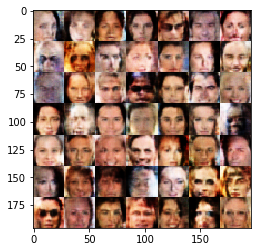

Epoch 1/1... Discriminator Loss: 0.1146... Generator Loss: 2.6211
Epoch 1/1... Discriminator Loss: 0.0303... Generator Loss: 5.3682
Epoch 1/1... Discriminator Loss: 0.1058... Generator Loss: 4.6172
Epoch 1/1... Discriminator Loss: 0.0998... Generator Loss: 2.7402
Epoch 1/1... Discriminator Loss: 0.0115... Generator Loss: 8.5194
Epoch 1/1... Discriminator Loss: 0.0197... Generator Loss: 7.9129
Epoch 1/1... Discriminator Loss: 0.0221... Generator Loss: 11.2692
Epoch 1/1... Discriminator Loss: 0.0563... Generator Loss: 10.4556
Epoch 1/1... Discriminator Loss: 0.0080... Generator Loss: 10.3458
Epoch 1/1... Discriminator Loss: 0.0390... Generator Loss: 4.9312


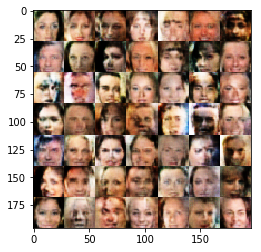

Epoch 1/1... Discriminator Loss: 0.0114... Generator Loss: 9.6652
Epoch 1/1... Discriminator Loss: 0.1520... Generator Loss: 2.6640
Epoch 1/1... Discriminator Loss: 0.0377... Generator Loss: 11.0392
Epoch 1/1... Discriminator Loss: 0.0112... Generator Loss: 8.7599
Epoch 1/1... Discriminator Loss: 0.0076... Generator Loss: 11.4081
Epoch 1/1... Discriminator Loss: 0.0351... Generator Loss: 8.2420
Epoch 1/1... Discriminator Loss: 0.0303... Generator Loss: 6.7005
Epoch 1/1... Discriminator Loss: 0.2106... Generator Loss: 2.6946
Epoch 1/1... Discriminator Loss: 0.1283... Generator Loss: 6.8655
Epoch 1/1... Discriminator Loss: 0.0399... Generator Loss: 5.6480


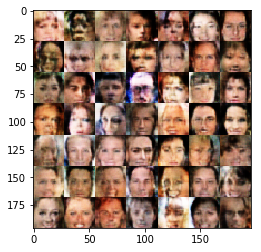

Epoch 1/1... Discriminator Loss: 0.1147... Generator Loss: 2.6354
Epoch 1/1... Discriminator Loss: 0.0871... Generator Loss: 6.6126
Epoch 1/1... Discriminator Loss: 0.2392... Generator Loss: 2.0638
Epoch 1/1... Discriminator Loss: 2.2998... Generator Loss: 0.1580
Epoch 1/1... Discriminator Loss: 0.0073... Generator Loss: 11.2589
Epoch 1/1... Discriminator Loss: 0.0073... Generator Loss: 6.6088
Epoch 1/1... Discriminator Loss: 0.0432... Generator Loss: 5.7579
Epoch 1/1... Discriminator Loss: 0.0536... Generator Loss: 4.7238
Epoch 1/1... Discriminator Loss: 0.0251... Generator Loss: 4.4976
Epoch 1/1... Discriminator Loss: 0.0455... Generator Loss: 4.6784


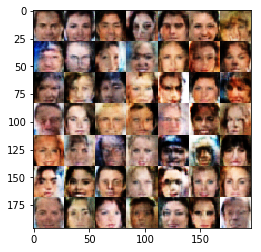

Epoch 1/1... Discriminator Loss: 0.8221... Generator Loss: 0.8297
Epoch 1/1... Discriminator Loss: 0.1207... Generator Loss: 2.5651
Epoch 1/1... Discriminator Loss: 1.4832... Generator Loss: 0.3989
Epoch 1/1... Discriminator Loss: 0.0680... Generator Loss: 7.1277
Epoch 1/1... Discriminator Loss: 0.0218... Generator Loss: 13.7882
Epoch 1/1... Discriminator Loss: 0.0122... Generator Loss: 7.1556
Epoch 1/1... Discriminator Loss: 0.7072... Generator Loss: 0.9422
Epoch 1/1... Discriminator Loss: 0.3389... Generator Loss: 1.5842
Epoch 1/1... Discriminator Loss: 0.6884... Generator Loss: 5.0834
Epoch 1/1... Discriminator Loss: 0.0780... Generator Loss: 4.4837


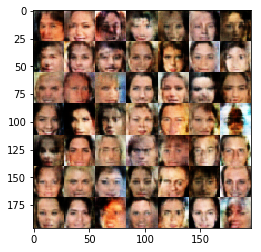

Epoch 1/1... Discriminator Loss: 0.3722... Generator Loss: 1.4228
Epoch 1/1... Discriminator Loss: 0.0200... Generator Loss: 5.5335
Epoch 1/1... Discriminator Loss: 0.0221... Generator Loss: 10.9276


In [38]:
batch_size = 32
z_dim = 100
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### 提交项目
提交本项目前，确保运行所有 cells 后保存该文件。

保存该文件为 "dlnd_face_generation.ipynb"， 并另存为 HTML 格式 "File" -> "Download as"。提交项目时请附带 "helper.py" 和 "problem_unittests.py" 文件。